
# ANÁLISIS DISCIPLINA INFORMÁTICA EN CHILE

**FRANCO ÁLVAREZ**  

**LUIS BENÍTEZ**

In [1]:
#Utilizaremos pandas junto a seaborn y altair

import pandas as pd
import seaborn as sns
import altair as alt
import matplotlib.pyplot as plt
import numpy as np





In [2]:

#Cargamos el archivo csv 
data = pd.read_csv("Titulados_Educacion_Superior_2019.csv",sep=";",low_memory=False)
#dt contiene toda nuestra base de datos de titulados 2019
dt=pd.DataFrame(data)


#Utilizamos como filtro el nombre de la carrera (Informática) y creamos un DataFRame con estos datos generando dtInf
dt['NOMB_CARRERA']=dt['NOMB_CARRERA'].str.lower()
dtInf = pd.DataFrame(dt[dt['NOMB_CARRERA'].str.contains('informatic')])


In [3]:
#Visualizamos los tipos de datos de nuetra DataFrame a través de la siguiente instrucción 
#dtInf.info()

In [4]:
#dtInf.columns
#Visualizamos los nombres de las columnas a través de la siguiente instrucción

# Gráfico n° 1: Número de alumnos según su edad (Ascendente)


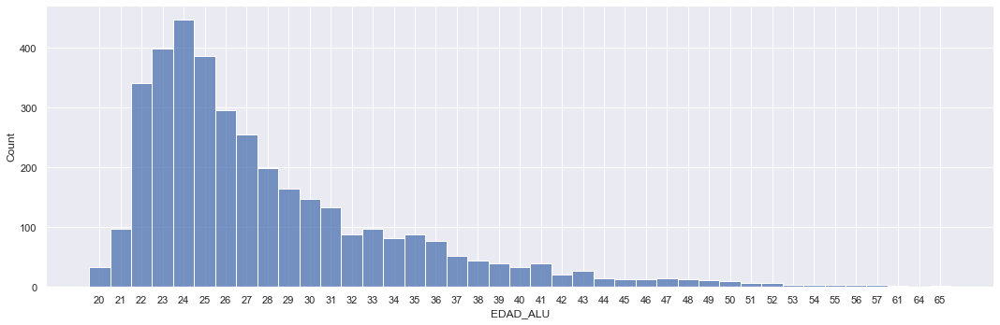

In [5]:

#Para este gráfico usaremos seaborn 

sns.set_theme(style="darkgrid")

sns.displot(data=dtInf.sort_values(by=["EDAD_ALU"]), x="EDAD_ALU",aspect=3,)


In [6]:
#Gráfico 1 pero proporción
#sns.displot(data=dtInf.sort_values(by=["EDAD_ALU"]), x="EDAD_ALU", kind="ecdf",aspect=3)

In [7]:
#Gráfico 1 pero con curva
#sns.displot(data=dtInf.sort_values(by=["EDAD_ALU"]), x="EDAD_ALU", kde=True,aspect=3)


In [8]:
#Contador de alumnos por edad
#dtInf["EDAD_ALU"].value_counts()


# Gráfico n°2: Relación alumnos titulados - Sede - Tipo Jornada

In [9]:
chart = alt.Chart(dtInf)

dtInf.EDAD_ALU = dtInf.EDAD_ALU.astype(int)

alt.Chart(dtInf).mark_circle().encode(
    alt.X('EDAD_ALU', axis=alt.Axis(title='EDAD DEL ALUMNO')),
    alt.Y('NOMB_SEDE', axis=alt.Axis(title='SEDE')),
    color='JORNADA'
).interactive()

alt.Chart(...)

# Gráfico n° 3:  N° Titulados por institución

In [10]:


alt.Chart(dtInf).mark_bar().encode(
    alt.X('NOMB_INST', axis=alt.Axis(title='INSTITUCIÓN')),
    alt.Y('count()',axis=alt.Axis(title='N° TITULADOS'))
).interactive()

alt.Chart(...)

# Cantidad de alumnos titulados por intitución

In [11]:
pd.DataFrame(dtInf["NOMB_INST"].value_counts())


,NOMB_INST
IP DUOC UC,848
UNIVERSIDAD TECNOLOGICA DE CHILE INACAP,753
IP AIEP,290
UNIVERSIDAD TECNICA FEDERICO SANTA MARIA,151
UNIVERSIDAD ANDRES BELLO,131
IP INSTITUTO SUPERIOR DE ARTES Y CIENCIAS DE LA COMUNICACION,126
IP SANTO TOMAS,126
UNIVERSIDAD DEL BIO-BIO,110
IP DR. VIRGINIO GOMEZ G.,71
UNIVERSIDAD METROPOLITANA DE CIENCIAS DE LA EDUCACION,69


# Gráfico n° 4: Gráfico de densidad regional de las instituciones con mayor cantidad de titulados

In [12]:
dtInfi = pd . Series (dtInf["NOMB_INST"].value_counts().head(3))

dtt1 = pd.DataFrame(dtInf[dtInf['NOMB_INST'].str.contains(dtInfi.index[0])])

dtt2 = pd.DataFrame(dtInf[dtInf['NOMB_INST'].str.contains(dtInfi.index[1])])

dtt3 = pd.DataFrame(dtInf[dtInf['NOMB_INST'].str.contains(dtInfi.index[2])])

# 4.1 IP DUOC UC 

In [13]:
alt.Chart(dtt1).mark_bar().encode(
    alt.Y('REGION_SEDE', axis=alt.Axis(title='REGION')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color="NOMB_INST"
    ).interactive()

alt.Chart(...)

# 4.2 UNIVERSIDAD TECNOLOGICA DE CHILE INACAP	

In [14]:
alt.Chart(dtt2).mark_bar().encode(
    alt.Y('REGION_SEDE', axis=alt.Axis(title='REGION')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color="NOMB_INST"
    ).interactive()

alt.Chart(...)

# 4.3 IP AIEP

In [15]:
alt.Chart(dtt3).mark_bar().encode(
    alt.Y('REGION_SEDE', axis=alt.Axis(title='REGION')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color="NOMB_INST"
    ).interactive()

alt.Chart(...)

# Gráfico n° 5: Título obtenido región metropolitana

In [16]:
dtMetropolitana = pd.concat([dtt1,dtt2,dtt3])

dtMetropolitana

alt.Chart(dtMetropolitana).mark_bar().encode(
    alt.Y('NOMB_TITULO_OBTENIDO', axis=alt.Axis(title='TÍTULO OBTENIDO')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color = "NOMB_INST"
    ).interactive()

alt.Chart(...)

# Gráfico n° 6: Gráfica titulados región del Bío Bío

In [17]:

dtt4 = pd.DataFrame(dtInf[dtInf['REGION_SEDE'].str.contains('BIOBÍO')])

alt.Chart(dtt4).mark_bar().encode(
    alt.Y('NOMB_INST', axis=alt.Axis(title='INSTITUCIONES')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color="NOMB_INST"
    ).interactive()

alt.Chart(...)

# Gráfico n° 7: Título obtenido región Bío Bío 

In [18]:
alt.Chart(dtt4).mark_bar().encode(
    alt.Y('NOMB_TITULO_OBTENIDO', axis=alt.Axis(title='TÍTULO OBTENIDO')),
    alt.X('count()',axis=alt.Axis(title='N° TITULADOS')),
    color = "NOMB_INST"
    ).interactive()



alt.Chart(...)

# Gráfico n°8: Titulados a nivel nacional por género

<Figure size 432x288 with 0 Axes>

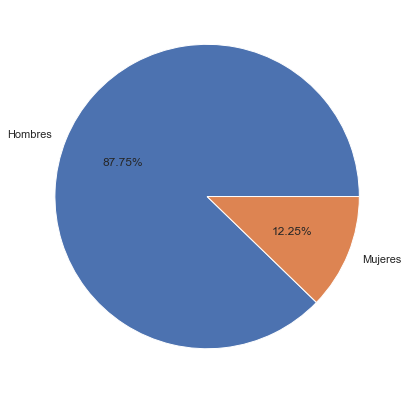

In [19]:
plt.figure()
plt.figure(figsize=(12,7))
values = dtInf["GEN_ALU"].value_counts().values
labels = ['Hombres','Mujeres']
plt.pie(values, labels=labels, autopct=('%.2f%%'))

plt.show()



# Gráfico n°9

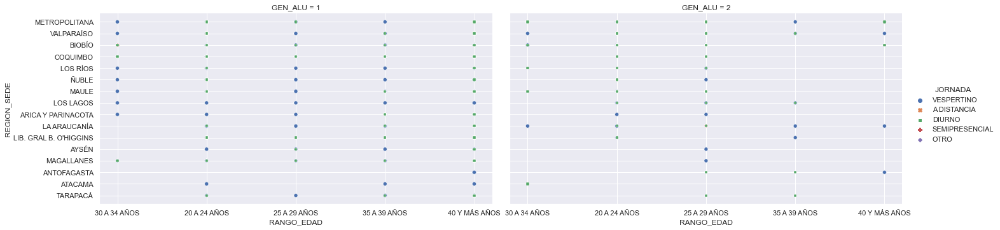

In [20]:
sns.set_theme()

sns.relplot(data=dtInf, x="RANGO_EDAD", y="REGION_SEDE", col="GEN_ALU",
    hue="JORNADA", style="JORNADA", aspect = 2)

In [21]:
#dtInf.EDAD_ALU = dtInf.EDAD_ALU.astype(int)

#g = sns.jointplot(
 #   data=dtInf.sort_values(by=["EDAD_ALU"]),
  #  x="EDAD_ALU", y="AÑO_ING_CARR", hue="JORNADA",
   # kind="kde",
#)